What to do:
1. Define the best temporary location for each store => DONE
2. Take the code bellow and replace the randomisation by the exel files (only 2 Weeks). => DONE
3. Run the code and get the loading results displayed in a graph => DONE
4. Loop the Supermaket locations (4 loops) to find the best location for each of them by calculating the average minimum load of the average of all the lines. => ToDo
5. Step 2 Done!

In [1]:
import sys
import pandapower as pp
import pandapower.networks as nw
import pandas as pd
import nbformat
import matplotlib.pyplot as plt
from pandapower.plotting.plotly import simple_plotly
from pandapower.plotting.plotly import pf_res_plotly
import copy
import pandapower as pp
from pandapower.plotting.plotly import simple_plotly
from pandapower.plotting.plotly import pf_res_plotly


net = pp.networks.create_cigre_network_mv(with_der=False)


net.load['p_mw']= net.load['p_mw'] / 2
net.load['q_mvar']= net.load['q_mvar'] / 2

pp.runpp(net)
print(net.load)

# print(net.res_bus)
# print(net.res_line.loading_percent)
# print(net.res_trafo.loading_percent)

# simple_plotly(net)
# pf_res_plotly(net)

         name  bus      p_mw    q_mvar  const_z_percent  const_i_percent  \
0     Load R1    1  7.497000  1.522331              0.0              0.0   
1     Load R3    3  0.138225  0.034642              0.0              0.0   
2     Load R4    4  0.215825  0.054091              0.0              0.0   
3     Load R5    5  0.363750  0.091164              0.0              0.0   
4     Load R6    6  0.274025  0.068677              0.0              0.0   
5     Load R8    8  0.293425  0.073539              0.0              0.0   
6    Load R10   10  0.237650  0.059561              0.0              0.0   
7    Load R11   11  0.164900  0.041328              0.0              0.0   
8    Load R12   12  7.497000  1.522331              0.0              0.0   
9    Load R14   14  0.104275  0.026134              0.0              0.0   
10   Load CI1    1  2.422500  0.796237              0.0              0.0   
11   Load CI3    3  0.112625  0.069799              0.0              0.0   
12   Load CI

1. Best temporary locations for each store:
ICA=> Average 1211 kW/h
Mathem => Average 787 kW/h
Postnord => Average 1000 kW/h
Airmee=> Average 317 kW/h

With the Graph Visualisation, the best locations for new loads seems to be Bus 6,8,14,4 for the best repartition of power load
Let's define 
ICA => Bus 8
Mathem => Bus 6
Postnord => 14
Airmee => 4

In [3]:
def check_within_limits(net_check, vmax=1.1, vmin=0.9, line_loading_max=100): 
    
    if net_check.res_bus.vm_pu.max() > vmax: return False

    if net_check.res_bus.vm_pu.min() < vmin: return False

    if net_check.res_line.loading_percent.max() > line_loading_max: return False

    else : return True 

STEP 2.2 (according to project doc)- MARGAUX

The code below is the newest version, it optimizes the location by minimizing the standard deviation on the max load between the lines. It also checks that we are within the limits. It skips testing buses 0, 1 and 12 as we dont want to connect to the grid directly and also dont want to connect to the transformers (we need to justify this better). Instead of rewriting the existing code at every iteration (like we used to) it creates a copy of the base network and adds the shops loads on respective buses, this solved the issue we had where it was impossible to edit bus 2. 

In [4]:
# ------------- 1. create network and apply initial change -------------
net0 = nw.create_cigre_network_mv(with_der=False)

net0.switch["closed"] = True  # close the tie switch

# scale down loads
net0.load['p_mw'] = net0.load['p_mw'] / 2.0
net0.load['q_mvar'] = net0.load['q_mvar'] / 2.0

base_loads = net0.load['p_mw'].copy()

# ------------- 2. Read the Excel File -------------
file_path = "Load_profiles_Freight transports.xlsx"
load_profile = pd.read_excel(file_path)

load_profile["Datetime"] = pd.to_datetime(load_profile["Date"].astype(str) + " " + load_profile["Time"].astype(str))
load_profile = load_profile.set_index("Datetime")

# Only keep the 4 shop columns
shops = ["ICA", "Mathem", "Postnord", "Airmee"]
load_profile = load_profile[shops]

# ------------- 3. Sequential shop placement -------------

# Define buses to skip
skip_buses = [0, 1, 12]

# Initialize shop placements
shop_to_bus = {
    "ICA": None,
    "Mathem": None,
    "Postnord": None,
    "Airmee": None,
}

best_net = None
best_res_lines = None

# Function to create network with shop loads
def create_network_with_shops(net_base, shop_mapping, timestamp):
    """Create a network with base loads + shop loads at specified buses"""
    net = copy.deepcopy(net_base)
    
    # Reset to base loads first
    net.load['p_mw'] = base_loads.copy()
    
    # Add shop loads to their respective buses
    for shop, bus in shop_mapping.items():
        if bus is not None:
            # Find if there's already a load at this bus
            existing_loads = net.load[net.load.bus == bus]
            
            if not existing_loads.empty:
                # Add to existing load
                load_idx = existing_loads.index[0]
                add_mw = load_profile.at[timestamp, shop] / 1000.0
                net.load.at[load_idx, 'p_mw'] += add_mw
            else:
                # Create new load at this bus
                add_mw = load_profile.at[timestamp, shop] / 1000.0
                pp.create_load(net, bus=bus, p_mw=add_mw, q_mvar=0)
    
    return net

# Test each shop sequentially
for shop in shops:
    print(f"Testing shop: {shop}")
    
    best_bus_for_shop = None
    best_std_dev = sys.float_info.max
    
    # Test all buses except the skipped ones
    for bus_index in range(1, 15):
        if bus_index in skip_buses:
            continue
            
        # Create temporary shop mapping for this test
        temp_shop_to_bus = shop_to_bus.copy()
        temp_shop_to_bus[shop] = bus_index
        
        # Skip if previous shops haven't been placed yet
        previous_shops = shops[:shops.index(shop)]
        if any(temp_shop_to_bus[s] is None for s in previous_shops):
            continue

        # ------------- 4. results DataFrame for line loading and bus voltages -------------
        line_indices = list(net0.line.index)
        bus_indices = list(net0.bus.index)
        
        col_names_lines = [f"line_{i}" for i in line_indices]
        col_names_buses = [f"{i}" for i in bus_indices]  # Just use bus numbers as column names
        
        res_lines = pd.DataFrame(index=load_profile.index, columns=col_names_lines, dtype=float)
        res_bus_voltages = pd.DataFrame(index=load_profile.index, columns=col_names_buses, dtype=float)

        # ------------- 5. simulation loop -------------
        valid_simulation = True
        checked = True
        
        for ts_idx, ts in enumerate(load_profile.index):
            if ts_idx % 24 == 0:  # Print progress every 24 hours
                print(f"  Testing bus {bus_index}, time: {ts}")

            # Create fresh network for this timestamp
            net = create_network_with_shops(net0, temp_shop_to_bus, ts)

            # run power flow
            try:
                pp.runpp(net, calculate_voltage_angles=False)
                if checked : checked = check_within_limits(net)
                
                loading = net.res_line.loading_percent
                voltages = net.res_bus.vm_pu
                
                for li in line_indices:
                    res_lines.at[ts, f"line_{li}"] = loading.at[li]
                
                for bi in bus_indices:
                    res_bus_voltages.at[ts, f"{bi}"] = voltages.at[bi]
                    
            except Exception as e:
                print(f"Power flow failed at {ts} for bus {bus_index}: {e}")
                valid_simulation = False
                break

        if not (valid_simulation and checked):
            continue

        # Calculate standard deviation of max line loads
        max_line_loads = res_lines.max()
        std_dev = max_line_loads.std()
        
        # Check if this is the best bus for this shop
        if std_dev < best_std_dev and checked:
            best_std_dev = std_dev
            best_bus_for_shop = bus_index
            print(f"New best bus for {shop}: {bus_index} with std dev: {best_std_dev:.4f}")
    
    # Place the shop at its best bus
    if best_bus_for_shop is not None:
        shop_to_bus[shop] = best_bus_for_shop
        print(f"Placed {shop} at bus {best_bus_for_shop}")
    else:
        print(f"Warning: No valid bus found for {shop}")
        # Place at first available bus as fallback
        for bus_index in range(1, 15):
            if bus_index not in skip_buses:
                shop_to_bus[shop] = bus_index
                print(f"Fallback: Placed {shop} at bus {bus_index}")
                break

print("Final shop placements:", shop_to_bus)

# ------------- 6. Run final simulation with all shops placed -------------
print("Running final simulation with all shops...")

line_indices = list(net0.line.index)
bus_indices = list(net0.bus.index)

col_names_lines = [f"line_{i}" for i in line_indices]
col_names_buses = [f"{i}" for i in bus_indices]

res_lines_final = pd.DataFrame(index=load_profile.index, columns=col_names_lines, dtype=float)
res_bus_voltages = pd.DataFrame(index=load_profile.index, columns=col_names_buses, dtype=float)

for ts_idx, ts in enumerate(load_profile.index):
    if ts_idx % 24 == 0:  # Print progress every 24 hours
        print(f"Final simulation progress: {ts}")
    
    net_final = create_network_with_shops(net0, shop_to_bus, ts)
    
    try:
        pp.runpp(net_final, calculate_voltage_angles=False)
        loading = net_final.res_line.loading_percent
        voltages = net_final.res_bus.vm_pu
        
        for li in line_indices:
            res_lines_final.at[ts, f"line_{li}"] = loading.at[li]
        
        for bi in bus_indices:
            res_bus_voltages.at[ts, f"{bi}"] = voltages.at[bi]
            
    except Exception as e:
        print(f"Final power flow failed at {ts}: {e}")
        res_lines_final.loc[ts, :] = np.nan
        res_bus_voltages.loc[ts, :] = np.nan

Testing shop: ICA
  Testing bus 2, time: 2026-01-01 00:00:00+01:00
  Testing bus 2, time: 2026-01-02 00:00:00+01:00
  Testing bus 2, time: 2026-01-03 00:00:00+01:00
  Testing bus 2, time: 2026-01-04 00:00:00+01:00
  Testing bus 2, time: 2026-01-05 00:00:00+01:00
  Testing bus 2, time: 2026-01-06 00:00:00+01:00
  Testing bus 2, time: 2026-01-07 00:00:00+01:00
  Testing bus 2, time: 2026-01-08 00:00:00+01:00
  Testing bus 2, time: 2026-01-09 00:00:00+01:00
  Testing bus 2, time: 2026-01-10 00:00:00+01:00
  Testing bus 2, time: 2026-01-11 00:00:00+01:00
  Testing bus 2, time: 2026-01-12 00:00:00+01:00
  Testing bus 2, time: 2026-01-13 00:00:00+01:00
  Testing bus 2, time: 2026-01-14 00:00:00+01:00
New best bus for ICA: 2 with std dev: 12.0752
  Testing bus 3, time: 2026-01-01 00:00:00+01:00
  Testing bus 3, time: 2026-01-02 00:00:00+01:00
  Testing bus 3, time: 2026-01-03 00:00:00+01:00
  Testing bus 3, time: 2026-01-04 00:00:00+01:00
  Testing bus 3, time: 2026-01-05 00:00:00+01:00
  Tes

FINAL OPTIMAL SHOP PLACEMENTS:
       ICA -> Bus 13
    Mathem -> Bus 6
  Postnord -> Bus 10
    Airmee -> Bus 6

PEAK EVENTS ANALYSIS
MAXIMUM LINE LOADING:
  Value: 61.03%
  Time: 2026-01-14 18:00:00+01:00
  Line: line_1
  Day: Wednesday, 2026-01-14

MINIMUM VOLTAGE (excluding slack bus 0):
  Value: 0.9728 p.u.
  Time: 2026-01-14 18:00:00+01:00
  Bus: 6
  Day: Wednesday, 2026-01-14

VOLTAGE STATUS: All voltages within limits (0.95-1.05 p.u.)


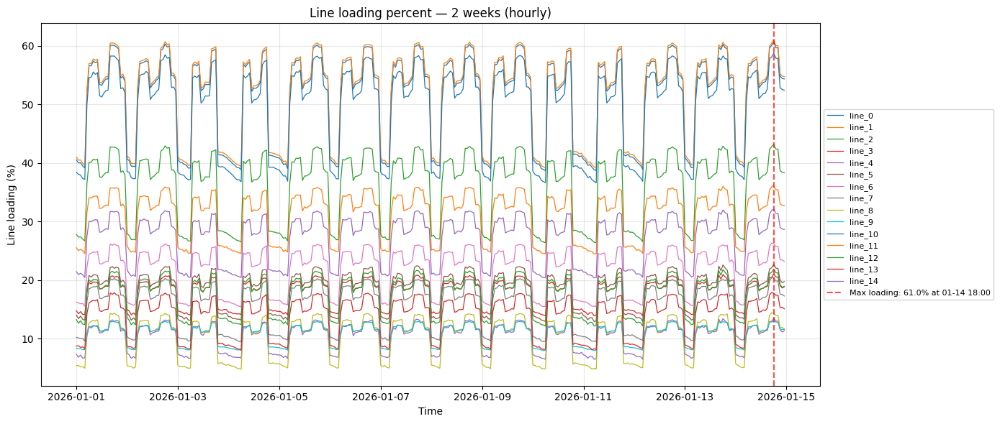

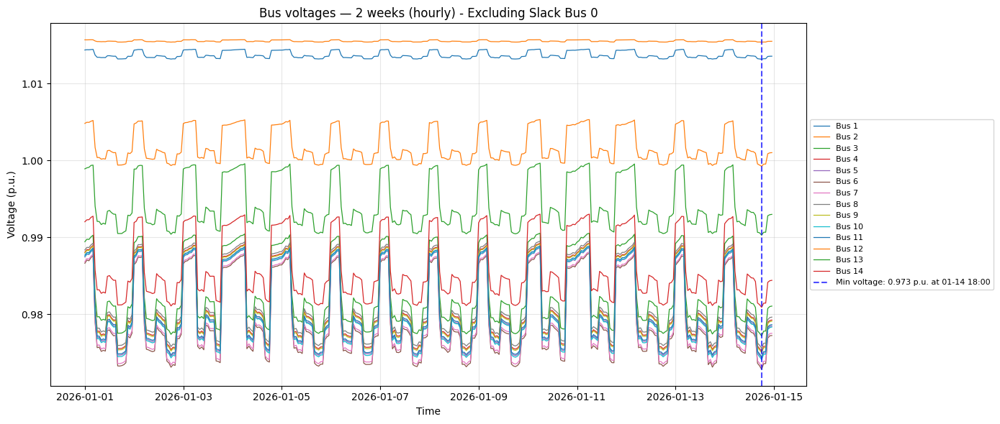

In [5]:
print("FINAL OPTIMAL SHOP PLACEMENTS:")
print("="*50)
for shop, bus in shop_to_bus.items():
    print(f"{shop:>10} -> Bus {bus}")
print("="*50)

# Find maximum loading and voltage events (exclude bus 0 for voltage analysis)
max_loading_value = res_lines_final.max().max()
max_loading_time = res_lines_final.stack().idxmax()
max_loading_line = res_lines_final.loc[max_loading_time[0]].idxmax()

# Exclude bus 0 (slack bus) from voltage analysis since it's constant
voltage_columns_without_slack = [col for col in res_bus_voltages.columns if col != '0']
res_bus_voltages_no_slack = res_bus_voltages[voltage_columns_without_slack]

max_voltage_value = res_bus_voltages_no_slack.max().max()
max_voltage_time = res_bus_voltages_no_slack.stack().idxmax()
max_voltage_bus = res_bus_voltages_no_slack.loc[max_voltage_time[0]].idxmax()

min_voltage_value = res_bus_voltages_no_slack.min().min()
min_voltage_time = res_bus_voltages_no_slack.stack().idxmin()
min_voltage_bus = res_bus_voltages_no_slack.loc[min_voltage_time[0]].idxmin()

print("\n" + "="*60)
print("PEAK EVENTS ANALYSIS")
print("="*60)
print(f"MAXIMUM LINE LOADING:")
print(f"  Value: {max_loading_value:.2f}%")
print(f"  Time: {max_loading_time[0]}")
print(f"  Line: {max_loading_line}")
print(f"  Day: {max_loading_time[0].strftime('%A, %Y-%m-%d')}")

print(f"\nMINIMUM VOLTAGE (excluding slack bus 0):")
print(f"  Value: {min_voltage_value:.4f} p.u.")
print(f"  Time: {min_voltage_time[0]}")
print(f"  Bus: {min_voltage_bus}")
print(f"  Day: {min_voltage_time[0].strftime('%A, %Y-%m-%d')}")

# Check if any voltages violate limits (excluding slack bus)
voltage_violations = []
for bus_col in voltage_columns_without_slack:
    bus_max = res_bus_voltages_no_slack[bus_col].max()
    bus_min = res_bus_voltages_no_slack[bus_col].min()
    
    if bus_max > 1.05:
        max_time = res_bus_voltages_no_slack[bus_col].idxmax()
        voltage_violations.append(f"Bus {bus_col}: {bus_max:.4f} p.u. (OVER VOLTAGE) at {max_time}")
    if bus_min < 0.95:
        min_time = res_bus_voltages_no_slack[bus_col].idxmin()
        voltage_violations.append(f"Bus {bus_col}: {bus_min:.4f} p.u. (UNDER VOLTAGE) at {min_time}")

if voltage_violations:
    print(f"\nVOLTAGE LIMIT VIOLATIONS:")
    for violation in voltage_violations:
        print(f"  {violation}")
else:
    print(f"\nVOLTAGE STATUS: All voltages within limits (0.95-1.05 p.u.)")

print("="*60)

# Plot 1: Line loading
plt.figure(figsize=(14, 6))
for col in res_lines_final.columns:
    plt.plot(res_lines_final.index, res_lines_final[col], linewidth=0.9, label=col)

# Mark the maximum loading point
plt.axvline(x=max_loading_time[0], color='red', linestyle='--', alpha=0.7, 
            label=f'Max loading: {max_loading_value:.1f}% at {max_loading_time[0].strftime("%m-%d %H:%M")}')

plt.xlabel("Time")
plt.ylabel("Line loading (%)")
plt.title("Line loading percent — 2 weeks (hourly)")
plt.grid(alpha=0.3)
plt.legend(loc="center left", bbox_to_anchor=(1, 0.5), ncol=1, fontsize=8)
plt.tight_layout()
plt.show()

# Plot 2: Bus voltages (excluding slack bus 0)
plt.figure(figsize=(14, 6))
for col in voltage_columns_without_slack:
    plt.plot(res_bus_voltages_no_slack.index, res_bus_voltages_no_slack[col], linewidth=0.9, label=f"Bus {col}")

# Mark the maximum and minimum voltage points
plt.axvline(x=min_voltage_time[0], color='blue', linestyle='--', alpha=0.7, 
            label=f'Min voltage: {min_voltage_value:.3f} p.u. at {min_voltage_time[0].strftime("%m-%d %H:%M")}')

plt.xlabel("Time")
plt.ylabel("Voltage (p.u.)")
plt.title("Bus voltages — 2 weeks (hourly) - Excluding Slack Bus 0")
plt.grid(alpha=0.3)
plt.legend(loc="center left", bbox_to_anchor=(1, 0.5), ncol=1, fontsize=8)
plt.tight_layout()
plt.show()

simple_plotly(net_final)
pf_res_plotly(net_final)

In [6]:
import pandapower as pp
import pandapower.networks as nw
import pandapower.topology as top
import networkx as nx
import pandas as pd
import numpy as np

print("N-1 CONTINGENCY ANALYSIS FOR SYSTEM WITH SHOPS")
print("Testing all timestamps over 2-week period")

# Define limits
LOADING_LIMIT = 100  # percentage
VOLTAGE_LOWER_LIMIT = 0.9  # p.u.
VOLTAGE_UPPER_LIMIT = 1.1  # p.u.

# Get all line indices for contingency analysis
line_indices = list(net_final.line.index)

critical_lines = []
total_violations_count = 0

for line_outage in line_indices:
    loading_violations_count = 0
    voltage_violations_count = 0
    
    for ts_idx, ts in enumerate(load_profile.index):
        # Create network for this timestamp with shops
        net_contingency = create_network_with_shops(net0, shop_to_bus, ts)
        
        # Apply line outage
        net_contingency.line.loc[line_outage, "in_service"] = False
        
        # Close all switches and build network
        net_contingency.switch["closed"] = True
        G = top.create_nxgraph(net_contingency, respect_switches=True)
        mst = nx.minimum_spanning_tree(G)
        
        # Open switches not in MST
        for j, sw in net_contingency.switch.iterrows():
            b1 = sw.bus
            if sw.et == "l":  # line switch
                line_bus = net_contingency.line.at[sw.element, "from_bus"] if net_contingency.line.at[sw.element, "from_bus"] != b1 else net_contingency.line.at[sw.element, "to_bus"]
                if not mst.has_edge(b1, line_bus):
                    net_contingency.switch.at[j, "closed"] = False
        
        # Run power flow
        try:
            pp.runpp(net_contingency)
            
            # Check for loading violations (only on in-service lines)
            in_service_lines = net_contingency.line[net_contingency.line.in_service].index
            if len(in_service_lines) > 0:
                max_loading = net_contingency.res_line.loading_percent.loc[in_service_lines].max()
                if max_loading > LOADING_LIMIT:
                    loading_violations_count += 1
            
            # Check voltage violations (excluding slack bus 0)
            bus_voltages = net_contingency.res_bus.vm_pu[net_contingency.bus.index != 0]
            if len(bus_voltages) > 0:
                min_voltage = bus_voltages.min()
                max_voltage = bus_voltages.max()
                
                if min_voltage < VOLTAGE_LOWER_LIMIT:
                    voltage_violations_count += 1
                if max_voltage > VOLTAGE_UPPER_LIMIT:
                    voltage_violations_count += 1
                    
        except Exception as e:
            # Count power flow failures as violations
            loading_violations_count += 1
            voltage_violations_count += 1
    
    total_line_violations = loading_violations_count + voltage_violations_count
    
    # Only store if this line caused any violations
    if total_line_violations > 0:
        critical_lines.append({
            'line': line_outage,
            'loading_violations': loading_violations_count,
            'voltage_violations': voltage_violations_count,
            'total_violations': total_line_violations
        })
        
        total_violations_count += total_line_violations


print("CONTINGENCY ANALYSIS RESULTS")

if critical_lines:
    print("CRITICAL LINES FOUND:")
    
    for critical in critical_lines:
        line = critical['line']
        loading_count = critical['loading_violations']
        voltage_count = critical['voltage_violations']
        total_line_violations = critical['total_violations']
        
        print(f"Line {line}:")
        print(f"   Loading violations: {loading_count}")
        print(f"   Voltage violations: {voltage_count}")
        print(f"   TOTAL VIOLATIONS: {total_line_violations}")
        print()
    
    print(f"Total critical lines: {len(critical_lines)} out of {len(line_indices)}")
    
    # Calculate overall statistics
    total_possible_scenarios = len(line_indices) * len(load_profile.index)
    total_percentage = (total_violations_count / (total_possible_scenarios * 2)) * 100  # *2 because we check both loading and voltage
    
    print(f"\nOVERALL 2-WEEK SUMMARY:")
    print(f"Total violations across all contingencies: {total_violations_count}")
    print(f"Average violations per critical line: {total_violations_count / len(critical_lines):.1f}")
    
else:
    print(" No critical lines found - system is N-1 secure!")

print("\nAnalysis completed!")

N-1 CONTINGENCY ANALYSIS FOR SYSTEM WITH SHOPS
Testing all timestamps over 2-week period
CONTINGENCY ANALYSIS RESULTS
CRITICAL LINES FOUND:
Line 0:
   Loading violations: 128
   Voltage violations: 0
   TOTAL VIOLATIONS: 128

Line 1:
   Loading violations: 128
   Voltage violations: 0
   TOTAL VIOLATIONS: 128

Line 10:
   Loading violations: 238
   Voltage violations: 0
   TOTAL VIOLATIONS: 238

Line 11:
   Loading violations: 178
   Voltage violations: 0
   TOTAL VIOLATIONS: 178

Line 14:
   Loading violations: 76
   Voltage violations: 0
   TOTAL VIOLATIONS: 76

Total critical lines: 5 out of 15

OVERALL 2-WEEK SUMMARY:
Total violations across all contingencies: 748
Average violations per critical line: 149.6

Analysis completed!
